<a href="https://colab.research.google.com/github/Moonba/fastai/blob/main/02_production_answers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Deep Learning

1. Where do text models currently have a major deficiency?
<br/>Conversational AI
1. What are possible negative societal implications of text generation models?
Loss of meaning. For example, chatbots not making meaningful conversations. 
1. In situations where a model might make mistakes, and those mistakes could be harmful, what is a good alternative to automating a process?
1. What kind of tabular data is deep learning particularly good at?
</br> Variables with High cardinality liek ZipCode or product ID 
1. What's a key downside of directly using a deep learning model for recommendation systems?
Evaluating the recommendations is not like evaluationg predictions.
Predicting that you'll buy product A, doesn't mean you will. Recommending product A means you may like it.
Recommending too similar items that may not be of interest for the user. 

1. What are the steps of the Drivetrain Approach?<br/>
  *  Defining a clear objective.
  *  Levers: What input can we control. What actions can we take to better achieve the obj.
  *  What data do we have and what data can we additionally collect.
  *  How the levers influence the objective.
1. How do the steps of the Drivetrain Approach map to a recommendation system?<br/>
The objective is to delight customers and motivate them to buy (increase sales).
The levers: We can do A/B testing by showing some recommendations to some users and omitting them to other users. Then analyze the purchase behaviour.
We can use purchase history,reviews of products, tracked behaviour like viewed products, searched products, sources of search(organic or marketing campaign or social media).
The recommendations output of the model can indicate if there was an increase of sales thanks to the recommendations or not.

In [ ]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

Mounted at /content/gdrive


In [ ]:
from fastbook import *
from fastai.vision.widgets import *

# Mummy Bears? 
To download images with Bing Image Search, sign up at Microsoft for a free account. You will be given a key, which you can copy and enter in a cell as follows (replacing 'XXX' with your key and executing it):

In [ ]:
key = os.environ.get('AZURE_SEARCH_KEY', 'XXX')

In [ ]:
# Redefining the function here until the search_url bug is fixed on fast ai api
def search_images_bing(key, term, max_images: int = 100, **kwargs):    
    params = {'q':term, 'count':max_images}
    headers = {"Ocp-Apim-Subscription-Key":key}
    search_url = "https://api.bing.microsoft.com/v7.0/images/search"
    response = requests.get(search_url, headers=headers, params=params)
    response.raise_for_status()
    search_results = response.json()    
    return L(search_results['value'])

In [ ]:
results = search_images_bing(key, 'grizzly bear', min_sz=128)
ims = results.attrgot('contentUrl')

len(ims)

100

In [ ]:
ims = ['http://3.bp.blogspot.com/-S1scRCkI3vY/UHzV2kucsPI/AAAAAAAAA-k/YQ5UzHEm9Ss/s1600/Grizzly%2BBear%2BWildlife.jpg']

In [ ]:
dest = 'images/grizzly.jpg'
download_url(ims[0], dest)

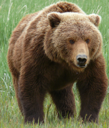

In [ ]:
im = Image.open(dest)
im.to_thumb(128,128)

In [ ]:
bear_types = 'grizzly','black','teddy'
path = Path('images/bears')

In [ ]:
if not path.exists():
    path.mkdir()
    for o in bear_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} bear')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [ ]:
fns = get_image_files(path) # Returns recursively all the images files in this path
fns

(#280) [Path('images/bears/teddy/00000059.jpg'),Path('images/bears/teddy/00000008.jpg'),Path('images/bears/teddy/00000022.jpg'),Path('images/bears/teddy/00000084.jpg'),Path('images/bears/teddy/00000019.jpg'),Path('images/bears/teddy/00000060.jpg'),Path('images/bears/teddy/00000090.png'),Path('images/bears/teddy/00000016.jpg'),Path('images/bears/teddy/00000083.jpg'),Path('images/bears/teddy/00000026.jpg')...]

In [ ]:
# Data Cleaning
failed = verify_images(fns) # Check that all downloaded files are actually images and not broken files
failed

(#10) [Path('images/bears/teddy/00000092.jpg'),Path('images/bears/teddy/00000018.jpg'),Path('images/bears/teddy/00000051.jpg'),Path('images/bears/teddy/00000047.jpg'),Path('images/bears/teddy/00000038.jpg'),Path('images/bears/grizzly/00000038.png'),Path('images/bears/black/00000014.jpg'),Path('images/bears/black/00000017.jpg'),Path('images/bears/black/00000091.jpg'),Path('images/bears/black/00000058.jpg')]

In [ ]:
failed.map(Path.unlink);  # Path unlink deletes the file

## From Data to DataLoaders

1. What is `DataLoaders`?
</br> DataLoader grabs a batch of images together, by default 64 to pass it to the GPU together
1. What letters are often used to signify the independent and dependent variables?<br/>
"The independent variable is the thing we are using to make predictions from, and the dependent variable is our target. In this case, our independent variables are images, and our dependent variables are the categories (type of bear) for each image."
1. What four things do we need to tell fastai to create `DataLoaders`?
  *   Blocks: (Input data:images, label data: categories)
  *   where to get the items
  *   validation split percentage
  *   ground_truth label (the parent folder name)

1. What does the `splitter` parameter to `DataBlock` do?</br>
split into traina and validation sets
1. How do we ensure a random split always gives the same validation set?</br>`seed=42` : Everytime we run the cell teh validation set will be the same

In [ ]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,   
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [ ]:
dls = bears.dataloaders(path)

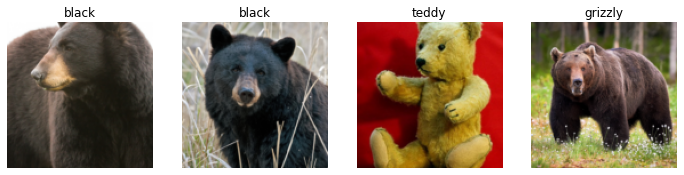

In [ ]:
dls.valid.show_batch(max_n=4, nrows=1)

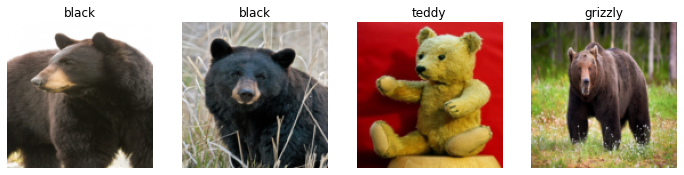

In [ ]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

Q. What's the difference between the crop, pad, and squish resize approaches? When might you choose one over the others?<br/>
Each method has its own problems.
*   The `resize` crop method looses some information.
*   `.Squish` the images were mis proportioned.
*   With `ResizeMethod.Pad` (`'zeroes'` means padded with black, default is `'reflect'` which shows reversed mirror reflection) there is wasted computation on the black part.

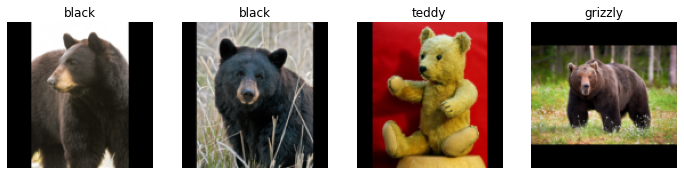

In [ ]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))  
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

`RandomResizedCrop`: Each time it will zoom in on a different part of the image. It means the model will see a part of the image each epoch. Not the same image every epoch. This prevents overfitting. 
This is one way to do **Data Augmentation**
<br/>`min_scale=0.3`: pick up at least 30% of the image each time
<br/>By default, transformations are only applied to training set except for `RandomResizedCrop` which is applied also to validation set automatically.
<br/>
1. What is data augmentation? Why is it needed?<br/>
The model seeing the same image a little bit different from the previous epoch.
1. What is the difference between item_tfms and batch_tfms?
<br/>`item_tfms` transforms one item(image) at a time like resize transformation. `batch_tfms` transforms a whole mini batch at a time.

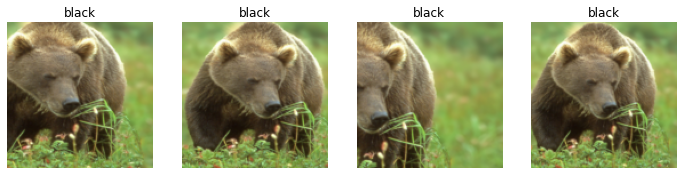

In [ ]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

### Data Augmentation

`aug_transforms` returns a list of different augmentations. There are augmentations which change contrast, brightness, warps/twists a perspective.

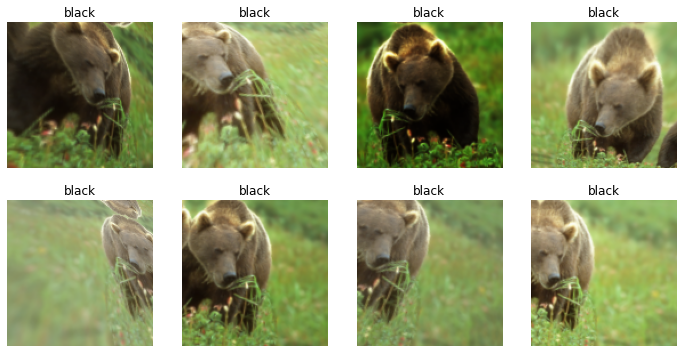

In [ ]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

## Training Your Model, and Using It to Clean Your Data

In [ ]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

In [ ]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.813322,2.399820,0.531915,00:13


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,0.837098,0.618458,0.297872,00:13
1,0.636604,0.072003,0.042553,00:13
2,0.465376,0.016503,0.000000,00:13
3,0.359009,0.011142,0.000000,00:13


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


1. What is a confusion matrix?
<br/> Matrix shows on the y axis the true labels compared to the predicted ones from our models on the X axis.<br/>
Diagonal values are correct. Others are misclassified.

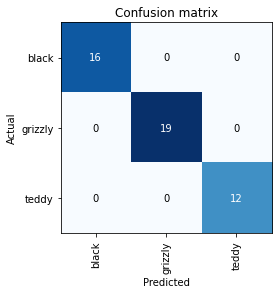

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Loss is higher if the model is incorrect (especially if it's confident in its incorrect answer) or if it's correct but with low confidence.
<br/>Here probability is the confidence level:

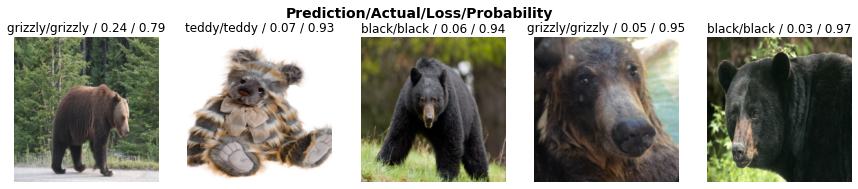

In [ ]:
interp.plot_top_losses(5, nrows=1)

We notice weirdness in the actual labeling. Hence we will use fast ai 's GUI for data cleaning: `ImageClassifierCleaner`

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [ ]:
# For each category and set: execute this code once after you make your labeling edits 
for idx in cleaner.delete(): 
  try:
    cleaner.fns[idx].unlink()
  except:
    print("Already removed")
for idx,cat in cleaner.change(): 
  try:
    shutil.move(str(cleaner.fns[idx]), path/cat)
  except:
    print("error:", sys.exc_info()[1])
    cleaner.fns[idx].unlink() # if fails to move because it exists at the other dir for ex, at least unlink from current dir

error: Destination path 'images/bears/grizzly/00000041.jpg' already exists


## Turning Your Model into an Online Application

### Using the Model for Inference

1. What does `export` save?
<br/>Exporting the model file that contains the architecture and all the parameters of the model
1. What is it called when we use a model for getting predictions, instead of training?<br/>Inference is when you use your trained model on new data, like in production env. You can upload your model on your server-inference.

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl') # Pickle File

(#1) [Path('export.pkl')]

In [ ]:
learn_inf = load_learner(path/'export.pkl')

In [ ]:
learn_inf.predict('images/grizzly.jpg')

('grizzly', tensor(1), tensor([2.0099e-05, 9.9997e-01, 8.3274e-06]))

tensor([probability of class 1, probability of class 2, probability of class 3])
<br/>
To remember the order of the classes use `.vocab`

In [ ]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

### GUI: Creating a Notebook App from the Model

1. What are IPython widgets?
They are GUI components that bring together JavaScript and Python functionality in a web browser and can be created/used in a jupyter notebook.<br/>
Voila: A system or making apps consisting of IPython widgets available to end-users without having to use a jupyter.

In [ ]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [ ]:
# In case you can't upload
# btn_upload = SimpleNamespace(data = ['images/grizzly.jpg'])

In [ ]:
img = PILImage.create(btn_upload.data[-1])

In [ ]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))  # With the output placeholder display a thumbnail of the image
out_pl

Output()

In [ ]:
pred,pred_idx,probs = learn_inf.predict(img)

In [ ]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: teddy; Probability: 0.9990')

In [ ]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [ ]:
# Event Handler
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [ ]:
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [ ]:
VBox([widgets.Label('Select your bear!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

### Turning Your Notebook into a Real App

1. Create an image recognition model using data you curate, and deploy it on the web.<br/>


In [ ]:
!pip install voila
!jupyter serverextension enable voila —sys-prefix

## Questionnaire

1. Provide an example of where the bear classification model might work poorly in production, due to structural or style differences in the training data.<br/>
Production photos are night time coming from a lower quality surveillance camera.

1. When might you want to use CPU for deployment? When might GPU be better?<br/>
In deployment, probably we're gonna predict one picture at a time. We won't need parallellism or a batch of images. Hence the CPU is more cost effective.

1. What are the downsides of deploying your app to a server, instead of to a client (or edge) device such as a phone or PC?
  *   user privacy concerns for sending their data to a remote server.
  *   Connectivity: can't work if the user's device is offline.
  *   vertical(scale up your server) vs horizontal scaling (users rely on their own hardware resources).

1. What are three examples of problems that could occur when rolling out a bear warning system in practice?<br/>
  *   low quality pictures
  *   other dangerous animals coming in that the model wasn't trained on.
  *   latency in response.

1. What is "out-of-domain data"?<br/>
The data we're trying to use inference on is different from the training data. (Like lower resolution, night time pictures)

1. What is "domain shift"?<br/>
The data that the models sees changes over time making the original training data not so relevant anymore.

1. What are the three steps in the deployment process?<br/>
  *   Manual process: Human monitoring the model's output.
    - Run model in parallel
    - Humans check predictions
  *   Limited scope deployment:Deploy on a small scale:
    - Careful human supervision
    - Time or geography limited
  *   Gradual expansion: Scaling up with measurements
    - Good reporting systems needed
    - Consider what could go wrong





### Further Research

1. Consider how the Drivetrain Approach maps to a project or problem you're interested in.
1. When might it be best to avoid certain types of data augmentation?
1. For a project you're interested in applying deep learning to, consider the thought experiment "What would happen if it went really, really well?"
1. Start a blog, and write your first blog post. For instance, write about what you think deep learning might be useful for in a domain you're interested in.